In [3]:
from diffusers import StableDiffusionPipeline
import torch
from safetensors.torch import load_file
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
# auto reload


# checkpoint_path='../saved_models/finetuned_chexpert-sd1.5/checkpoint-9-2500/model.safetensors'
# checkpoint = load_file(checkpoint_path)

# pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5").to("cuda")
# pipe.unet.load_state_dict(checkpoint)
# pipe.to("cuda")

# # Unconditional sampling (empty prompt)
# image = pipe("").images[0]

In [4]:
%load_ext autoreload
%autoreload 2

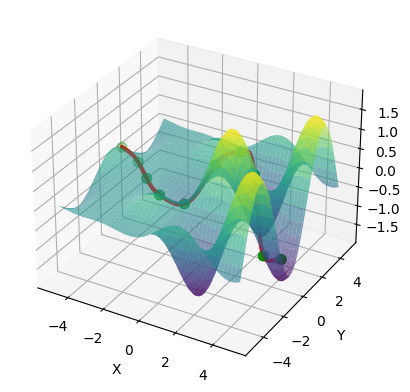

In [5]:
# Create a complex parametric surface
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
x, y = np.meshgrid(x, y)
z = (1+np.sin(x/2))*np.sin(x)*np.cos(y)  # Complex surface equation

# Plot the surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, z, cmap='viridis', alpha=0.6)

# Define a line on the surface (a sinusoidal curve)
t = np.linspace(-5, 5, 100)
x_line = t
y_line = np.sin(t)  # y = sin(t)
# z_line = np.sin(np.sqrt(x_line**2 + y_line**2)) * np.cos(x_line)  # Surface equation
z_line = (1+np.sin(x_line/2))*np.sin(x_line)*np.cos(y_line)  # Complex surface equation
# (1+sin(x/2))*sin(x)*cos(y)
# Plot the line on the surface (in red)
ax.plot(x_line, y_line, z_line, color='r', linewidth=3)

# Plot some dots along the line
dots = 10  # Number of dots
dot_indices = np.linspace(0, len(t) - 1, dots, dtype=int)
ax.scatter(x_line[dot_indices], y_line[dot_indices], z_line[dot_indices], color='g', s=50)  # Green dots

# Set axis labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Show the plot
plt.show()


In [8]:
import numpy as np
import plotly.graph_objects as go

# Create a complex parametric surface
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
x, y = np.meshgrid(x, y)
z = (1 + np.sin(x / 2)) * np.sin(x) * np.cos(y)  # Complex surface equation

# Define a line on the surface (a sinusoidal curve)
t = np.linspace(-5, 5, 100)
x_line = t
y_line = np.sin(t)  # y = sin(t)
z_line = (1 + np.sin(x_line / 2)) * np.sin(x_line) * np.cos(y_line)

# Create surface plot
surface = go.Surface(x=x, y=y, z=z, colorscale='viridis', opacity=1)

# Create line plot
line = go.Scatter3d(x=x_line, y=y_line, z=z_line, mode='lines', line=dict(color='red', width=5))

# Create scatter plot for dots along the line
dots = 10  # Number of dots
dot_indices = np.linspace(0, len(t) - 1, dots, dtype=int)
dots_scatter = go.Scatter3d(
    x=x_line[dot_indices], 
    y=y_line[dot_indices], 
    z=z_line[dot_indices], 
    mode='markers',
    marker=dict(color='green', size=5)
)

# Combine plots
fig = go.Figure(data=[surface, line, dots_scatter])

# Set axis labels
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)

# Show interactive plot
fig.show()

In [18]:
import numpy as np
import plotly.graph_objects as go

# Create a complex parametric surface
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
x, y = np.meshgrid(x, y)
z = (1 + np.sin(x / 2)) * np.sin(x) * np.cos(y)  # Complex surface equation

# Define a line on the surface (a sinusoidal curve) with a limit on the range of t
t_min_1, t_max_1 = -2, 2  # Set the limits for the line
t_1 = np.linspace(t_min_1, t_max_1, 100)  # Limit the t values within the specified range

# Parametric equations for the line
x_line_1 = t_1
y_line_1 = np.sin(t_1)  # y = sin(t)
z_line_1 = (1 + np.sin(x_line_1 / 2)) * np.sin(x_line_1) * np.cos(y_line_1)

# Define a line on the surface (a sinusoidal curve) with a limit on the range of t
t_min_2, t_max_2 = -2, 2  # Set the limits for the line
t_2 = np.linspace(t_min_2, t_max_2, 100)  # Limit the t values within the specified

# Parametric equations for the line
x_line_2 = x_line_1[0] + np.linspace(0, 2, 100)
y_line_2 = y_line_1[0] + np.linspace(0, 6, 100)
z_line_2 = (1 + np.sin(x_line_2 / 2)) * np.sin(x_line_2) * np.cos(y_line_2)


# Create surface plot
surface = go.Surface(x=x, y=y, z=z, colorscale='viridis', opacity=1)

# Create line plot
line1 = go.Scatter3d(x=x_line_1, y=y_line_1, z=z_line_1, mode='lines', line=dict(color='red', width=5))
line2 = go.Scatter3d(x=x_line_2, y=y_line_2, z=z_line_2, mode='lines', line=dict(color='blue', width=5))


# Create scatter plot for dots along the line
dots = 10  # Number of dots
dot_indices = np.linspace(0, len(t) - 1, dots, dtype=int)
dots_scatter1 = go.Scatter3d(
    x=x_line_1[dot_indices], 
    y=y_line_1[dot_indices], 
    z=z_line_1[dot_indices], 
    mode='markers',
    marker=dict(color='green', size=5)
)

dots_scatter2 = go.Scatter3d(
    x=x_line_2[dot_indices], 
    y=y_line_2[dot_indices], 
    z=z_line_2[dot_indices], 
    mode='markers',
    marker=dict(color='green', size=5)
)

# Combine plots
fig = go.Figure(data=[surface, line1, dots_scatter1, line2, dots_scatter2])

# Set axis labels
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    )
)

# Show interactive plot
fig.show()


In [45]:
import numpy as np
import plotly.graph_objects as go

# Create a complex parametric surface
x = np.linspace(-4, 4, 100)
y = np.linspace(-4, 4, 100)
x, y = np.meshgrid(x, y)  # Generate mesh grid for x and y
z = (1 + np.sin(x / 2)) * np.sin(x) * np.cos(y)  # Complex surface equation

# Define a line on the surface (a sinusoidal curve) with a limit on the range of t
t_min_1, t_max_1 = -2, 2  # Set the limits for the line
t_1 = np.linspace(t_min_1, t_max_1, 100)  # Limit the t values within the specified range

# Parametric equations for the line
x_line_1 = t_1
y_line_1 = np.sin(t_1)  # y = sin(t)
z_line_1 = (1 + np.sin(x_line_1 / 2)) * np.sin(x_line_1) * np.cos(y_line_1)

# Define another line on the surface with a limit on the range of t
t_min_2, t_max_2 = -2, 2  # Set the limits for the second line
t_2 = np.linspace(t_min_2, t_max_2, 100)  # Limit the t values for the second line

# Parametric equations for the second line
x_line_2 = x_line_1[0] + np.linspace(0, 2, 100)
y_line_2 = y_line_1[0] + np.linspace(0, 6, 100)
z_line_2 = (1 + np.sin(x_line_2 / 2)) * np.sin(x_line_2) * np.cos(y_line_2)

# Create surface plot
surface = go.Surface(x=x, y=y, z=z, colorscale='viridis', opacity=1)

# Create line plot for first and second lines with thicker lines
line1 = go.Scatter3d(x=x_line_1, y=y_line_1, z=z_line_1, mode='lines', line=dict(color='red', width=10))  # Thicker line
line2 = go.Scatter3d(x=x_line_2, y=y_line_2, z=z_line_2, mode='lines', line=dict(color='blue', width=10))  # Thicker line

# Create scatter plot for dots along the lines
# dots = 10  # Number of dots
# dot_indices = np.linspace(0, len(t_1) - 1, dots, dtype=int)

# # Dots for first line
# dots_scatter1 = go.Scatter3d(
#     x=x_line_1[dot_indices], 
#     y=y_line_1[dot_indices], 
#     z=z_line_1[dot_indices], 
#     mode='markers',
#     marker=dict(color='green', size=5)
# )

# # Dots for second line
# dots_scatter2 = go.Scatter3d(
#     x=x_line_2[dot_indices], 
#     y=y_line_2[dot_indices], 
#     z=z_line_2[dot_indices], 
#     mode='markers',
#     marker=dict(color='green', size=5)
# )

# Add mesh grid lines (optional)
mesh_lines = []
for i in range(len(x)):
    # Grid lines for constant x
    mesh_lines.append(go.Scatter3d(
        x=x[i, :], 
        y=y[i, :], 
        z=z[i, :], 
        mode='lines', 
        line=dict(color='black', width=1)
    ))

for j in range(len(y)):
    # Grid lines for constant y
    mesh_lines.append(go.Scatter3d(
        x=x[:, j], 
        y=y[:, j], 
        z=z[:, j], 
        mode='lines', 
        line=dict(color='black', width=1)
    ))

# Combine all plots
fig = go.Figure(data=[surface, line1, line2] + mesh_lines)

# Set axis labels
fig.update_layout(
    plot_bgcolor='white',
    showlegend=False,
    scene=dict(
        xaxis_title='',
        yaxis_title='',
        zaxis_title='',
        xaxis=dict(showgrid=False, showticklabels=False, zeroline=False),
        yaxis=dict(showgrid=False, showticklabels=False, zeroline=False),
        zaxis=dict(showgrid=False, showticklabels=False, zeroline=False),
        bgcolor='white'
    )
)

# Show interactive plot
fig.show()
